## Problem Statement :

#### The challenge involves analyzing a dataset of user data from an e-commerce website and developing a model to predict which users are most likely to make a purchase. The dataset includes information such as user demographics, website behavior, and marketing channel sources. Participants are tasked with developing a model that can accurately predict conversion rates and provide insights on how to optimize marketing strategies to increase conversions. The project provides an opportunity to practice data analysis and machine learning skills

In [3]:
# Importing module

import pandas as pd

import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
import plotly.subplots as sp

import seaborn as sns

import matplotlib.pyplot as plt
from plotly.subplots import make_subplots 


from sklearn.model_selection import train_test_split, RepeatedStratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.preprocessing import  OneHotEncoder, StandardScaler, LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression, RidgeClassifier, Ridge, Lasso
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, recall_score, precision_score, roc_curve, auc, precision_recall_curve, roc_auc_score, ConfusionMatrixDisplay
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier 
from sklearn.naive_bayes import GaussianNB



# import ensemble methods
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, AdaBoostClassifier, GradientBoostingClassifier, VotingClassifier, StackingClassifier, ExtraTreesClassifier
from xgboost import XGBClassifier

from sklearn.inspection import permutation_importance
from sklearn.model_selection import cross_val_score, GridSearchCV
import warnings
warnings.filterwarnings('ignore')

In [4]:
data = pd.read_csv('src/conversion_data_train.csv')

print('Numbers of rows :', data.shape[0], '\n')

print('Display dataset : ')
display(data.head())


print('\n Display basics statistics :')
display(data.describe(include='all'))


print('\n Display types of each variable :')
print(data.dtypes)

print('\n Percentage of missing values :')
display(data.isnull().sum()/data.shape[0]*100)

Numbers of rows : 284580 

Display dataset : 


,country,age,new_user,source,total_pages_visited,converted
0,China,22,1,Direct,2,0
1,UK,21,1,Ads,3,0
2,Germany,20,0,Seo,14,1
3,US,23,1,Seo,3,0
4,US,28,1,Direct,3,0



 Display basics statistics :


,country,age,new_user,source,total_pages_visited,converted
count,284580,284580.000000,284580.000000,284580,284580.000000,284580.000000
unique,4,NaN,NaN,3,NaN,NaN
top,US,NaN,NaN,Seo,NaN,NaN
freq,160124,NaN,NaN,139477,NaN,NaN
mean,NaN,30.564203,0.685452,NaN,4.873252,0.032258
std,NaN,8.266789,0.464336,NaN,3.341995,0.176685
min,NaN,17.000000,0.000000,NaN,1.000000,0.000000
25%,NaN,24.000000,0.000000,NaN,2.000000,0.000000
50%,NaN,30.000000,1.000000,NaN,4.000000,0.000000
75%,NaN,36.000000,1.000000,NaN,7.000000,0.000000



 Display types of each variable :
country                object
age                     int64
new_user                int64
source                 object
total_pages_visited     int64
converted               int64
dtype: object

 Percentage of missing values :


country                0.0
age                    0.0
new_user               0.0
source                 0.0
total_pages_visited    0.0
converted              0.0
dtype: float64

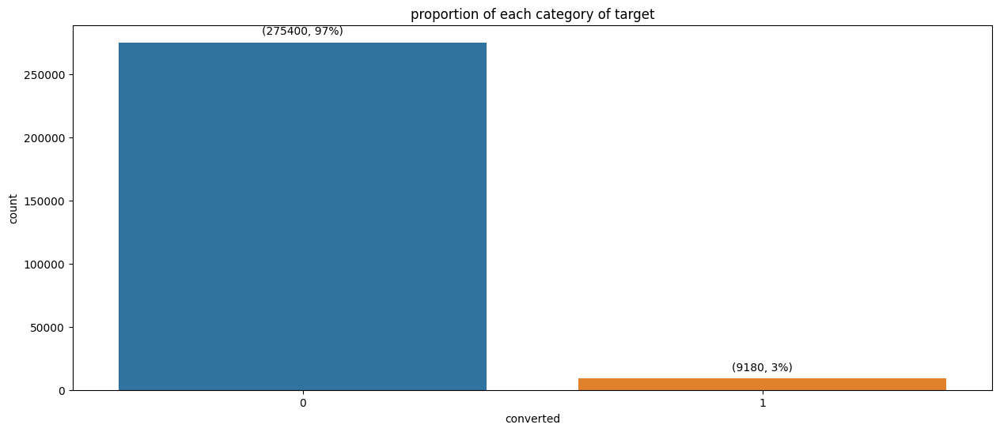

In [5]:
prop_HF = data["converted"].value_counts(normalize=True).reset_index()
prop_HF.columns = ["converted", "proportion"]


plt.figure(figsize=(15,6)) 
ax = sns.countplot(data=data, x='converted')
ax.set(title='proportion of each category of target')

# Add number and proportion of each category
for p, prop, count in zip(ax.patches, prop_HF["proportion"], data["converted"].value_counts().sort_index()):
    ax.annotate(f'({count}, {prop:.0%})', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

plt.show()


#### The `converted` variable in the dataset measures whether or not a user completed a desired action during their session on the website, such as making a purchase. Approximately 3% of users in the dataset converted, while the remaining 97% did not. So we are facing to unbalanced binary labels problem. 

#### Since the `converted` variable is the target variable for our analysis and modeling, it is crucial to understand its distribution and any patterns or trends that may impact our ability to accurately predict the likelihood of conversion. This variable will be a key factor in evaluating the effectiveness of any models we develop and in informing recommendations for improving website performance.

In [6]:
print('Number of people who are over 80 years old : \n', (data['age']>80).value_counts())

# Create a figure with 2 subplots
fig = sp.make_subplots(rows=1, cols=2, subplot_titles=('Age Histogram', 'Age Box plot'))

# Add the histogram to the first subplot
fig.add_trace(px.histogram(data_frame=data, x='age').data[0], row=1, col=1)

# Add the box plot to the second subplot
fig.add_trace(px.box(data_frame=data, x='age').data[0], row=1, col=2)

# Update the layout of the figure
fig.update_layout(width=1000, height=500)

# Display the plot
fig.show()

Number of people who are over 80 years old : 
 age
False    284578
True          2
Name: count, dtype: int64


[Text(0.5, 1.0, 'Age repartition by respect of converted status')]

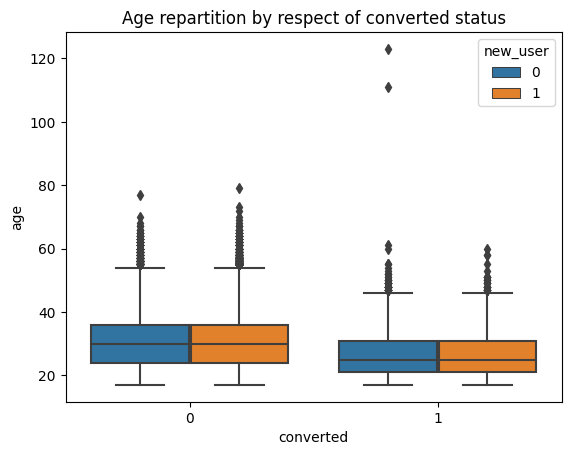

In [17]:
sns.boxplot(data=data, x='converted', y='age', hue='new_user').set(title='Age repartition by respect of converted status')

In [8]:
from scipy.stats import shapiro, mannwhitneyu, anderson, levene

# Verify normality using the Shapiro-Wilk test
num_var = ['age', 'total_pages_visited']
for var in num_var:
    _, p_value = shapiro(data[var])
    if p_value > 0.05:
        print(f"The sample '{var}' with p_value = {p_value} is normally distributed")
    else:
        print(f"The sample '{var}' with p_value = {p_value} is not normally distributed")
        


The sample 'age' with p_value = 0.0 is not normally distributed
The sample 'total_pages_visited' with p_value = 0.0 is not normally distributed


#### Because N>5000 let try anderson test

In [9]:
# Because N>5000 let try anderson test
for var in num_var:
    result = anderson(data[var], dist='norm')
    if result.statistic > result.critical_values[2]:
        print(f"The sample '{var}' is not normally distributed")
    else:
        print(f"The sample '{var}' is normally distributed")

The sample 'age' is not normally distributed
The sample 'total_pages_visited' is not normally distributed


In [10]:
conv1 = data['age'][data['converted']==1]
conv0 = data['age'][data['converted']==0]

_, p_value = levene(conv1, conv0)

if p_value < 0.05:
    print("The difference in variances between the two samples is statistically significant")
else:
    print("The difference in variances between the two samples is not statistically significant")

The difference in variances between the two samples is statistically significant


In [11]:
_, p_value = mannwhitneyu(conv1, conv0)
if p_value < 0.05:
    print("The means of the two samples are significantly different")
else:
    print("The means of the two samples are not significantly different")

The means of the two samples are significantly different


#### The `age` variable in the dataset is a numerical variable that ranges from 17 to 123 years old, with a median value of 30. The distribution of ages is slightly right-skewed, with the majority of values falling between 24 and 36 years old. There are a few outliers in the distribution, with a maximum value of 123 years old. Overall, the age distribution appears to be fairly typical for a marketing dataset, with no unusual patterns or trends that are immediately apparent.

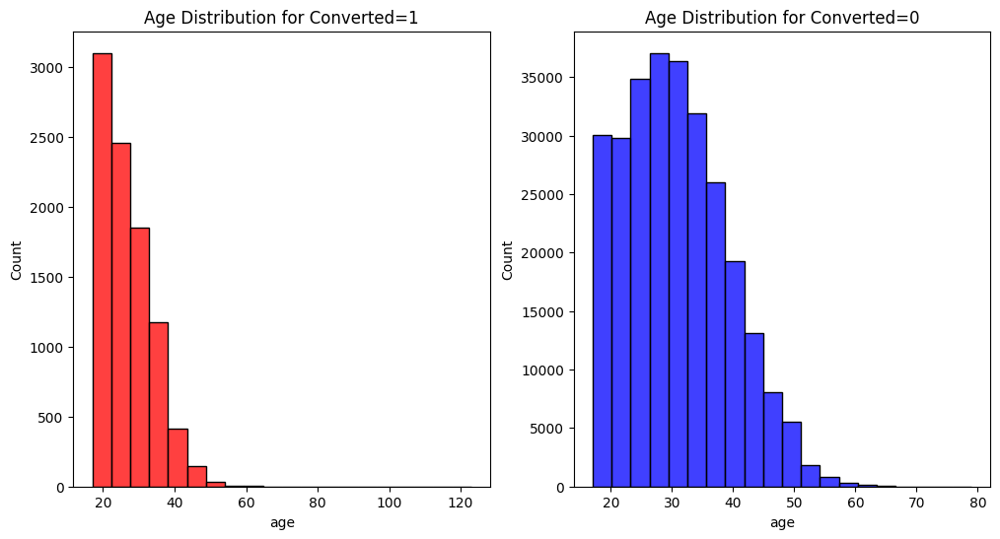

In [13]:
# Subset the data for converted equals 1
converted_1 = data[data['converted'] == 1]

# Subset the data for converted equals 0
converted_0 = data[data['converted'] == 0]

# Create two subplots for the age distribution by converted
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12,6))

# Plot the age distribution for converted equals 1
sns.histplot(converted_1['age'], bins=20, ax=ax1, color='red')
ax1.set_title('Age Distribution for Converted=1')

# Plot the age distribution for converted equals 0
sns.histplot(converted_0['age'], bins=20, ax=ax2, color='blue')
ax2.set_title('Age Distribution for Converted=0')

plt.show()


#### The distribution of ages is fairly similar for both converted and non-converted users, with a slightly higher number of converted users in the 25-35 age range. There is also a noticeable decrease in the number of users above the age of 40, which suggests that the website may be less popular among older users. Overall, the age distribution analysis provides some insights into the user demographics and could help inform targeted marketing strategies.

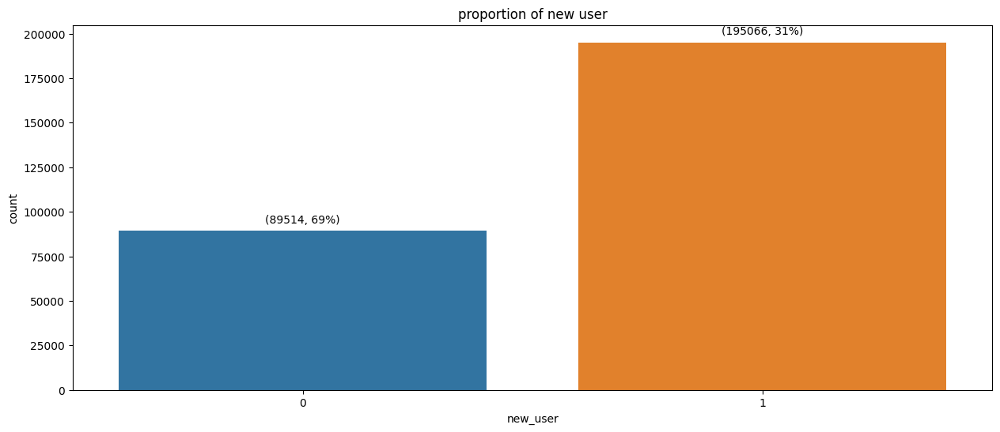

In [19]:
prop_HF = data["new_user"].value_counts(normalize=True).reset_index()
prop_HF.columns = ["new_user", "proportion"]


plt.figure(figsize=(15,6))
ax = sns.countplot(data=data, x='new_user')
ax.set(title='proportion of new user')

# Add number and proportion of each category
for p, prop, count in zip(ax.patches, prop_HF["proportion"], data["new_user"].value_counts().sort_index()):
    ax.annotate(f'({count}, {prop:.0%})', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

plt.show()


#### The `new_user` variable in the dataset is a binary categorical variable that indicates whether a user is new or returning. Approximately 68% of users in the dataset are new, while the remaining 32% are returning users. 

[Text(0.5, 1.0, 'proportion of new user by respect of converted status')]

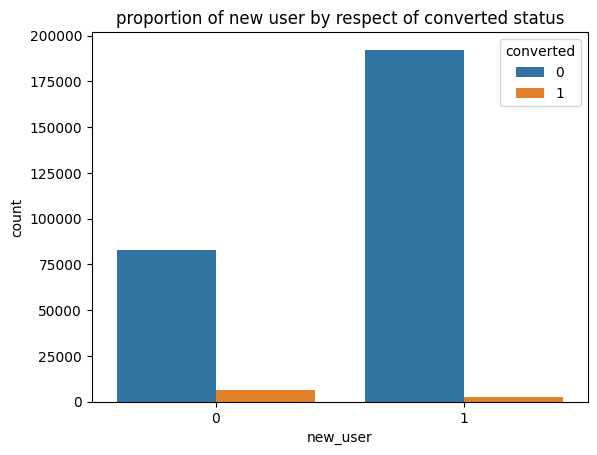

In [22]:
sns.countplot(data=data, x='new_user', hue='converted').set(title='proportion of new user by respect of converted status')

In [23]:
from scipy.stats import chi2_contingency
# Créer un tableau de contingence
contingency_table = pd.crosstab(data['converted'], data['new_user'])
contingency_table

new_user,0,1
converted,,
0,83075,192325
1,6439,2741


In [24]:

chi2_stat, p_value, dof, expected_freq = chi2_contingency(contingency_table)


print("Statistique du chi-carré :", chi2_stat)
print("P-valeur :", p_value)
print("Degrés de liberté :", dof)
print("Fréquences attendues :\n", expected_freq)

if p_value < 0.05:
    print("There is a significant association between the variables")
else:
    print("There is no significant association between the variables")

Statistique du chi-carré : 6582.99422375558
P-valeur : 0.0
Degrés de liberté : 1
Fréquences attendues :
 [[ 86626.4516129 188773.5483871]
 [  2887.5483871   6292.4516129]]
There is a significant association between the variables


In [25]:
# Cramér-V coefficient computing
n = contingency_table.sum().sum()
min_dim = min(contingency_table.shape) - 1
cramer_v = np.sqrt(chi2_stat / (n * min_dim))

# Display Cramér-V coefficient 
print("Coefficient de Cramér-V :", cramer_v)

Coefficient de Cramér-V : 0.15209311317080818


#### Analysis of conversion rates reveals that new users have a lower conversion rate than returning users, suggesting that returning users may be more likely to complete a purchase or take another desired action. However, it's worth noting that the dataset is imbalanced in favor of new users, which could potentially skew these results.

4.0

In [26]:
print('Mean of total_pages_visited :', round(data['total_pages_visited'].mean(), 2))
print('\nMedian of total_pages_visited :', round(data['total_pages_visited'].median(),2))

# Create a figure with 2 subplots
fig = sp.make_subplots(rows=1, cols=2, subplot_titles=('total_pages_visited Histogram', 'total_pages_visited Box plot'))

# Add the histogram to the first subplot
fig.add_trace(px.histogram(data_frame=data, x='total_pages_visited').data[0], row=1, col=1)

# Add the box plot to the second subplot
fig.add_trace(px.box(data_frame=data, x='total_pages_visited').data[0], row=1, col=2)

# Update the layout of the figure
fig.update_layout(width=1000, height=500)

# Display the plot
fig.show()

Mean of total_pages_visited : 4.87

Median of total_pages_visited : 4.0


#### The `total_pages_visited` variable in the dataset measures the total number of pages visited by a user during their session on the website. The distribution of this variable is highly skewed, with a mean of 4.8 pages visited and a median of 4 pages visited. 

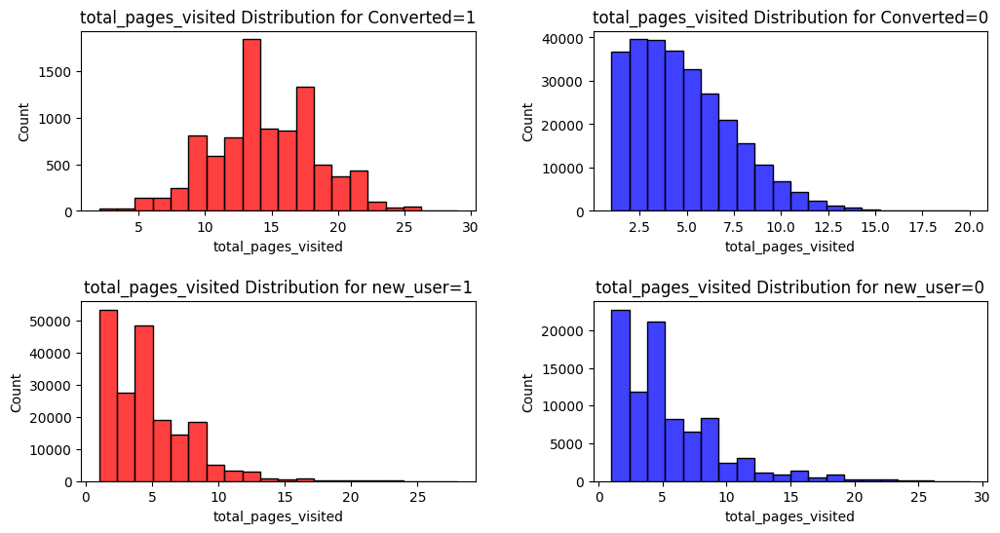

In [27]:
# Subset the data for converted equals 1
converted_1 = data[data['converted'] == 1]

# Subset the data for converted equals 0
converted_0 = data[data['converted'] == 0]


# Subset the data for new_user equals 1
new_user_1 = data[data['new_user'] == 1]

# Subset the data for new_user equals 0
new_user_0 = data[data['new_user'] == 0]

# Create two subplots for the total pages visited  distribution by converted and new_user
fig, ((ax11, ax12), (ax21, ax22)) = plt.subplots(nrows=2, ncols=2, figsize=(12,6), gridspec_kw={'wspace': 0.3, 'hspace': 0.5})

# Plot the age distribution for converted equals 1
sns.histplot(converted_1['total_pages_visited'], bins=20, ax=ax11, color='red')
ax11.set_title('total_pages_visited Distribution for Converted=1')

# Plot the age distribution for converted equals 0
sns.histplot(converted_0['total_pages_visited'], bins=20, ax=ax12, color='blue')
ax12.set_title('total_pages_visited Distribution for Converted=0')


# Plot the age distribution for new_user equals 1
sns.histplot(new_user_1['total_pages_visited'], bins=20, ax=ax21, color='red')
ax21.set_title('total_pages_visited Distribution for new_user=1')

# Plot the age distribution for new_user equals 0
sns.histplot(new_user_0['total_pages_visited'], bins=20, ax=ax22, color='blue')
ax22.set_title('total_pages_visited Distribution for new_user=0')


plt.show()


[Text(0.5, 1.0, 'Total pages visited by respect converted status')]

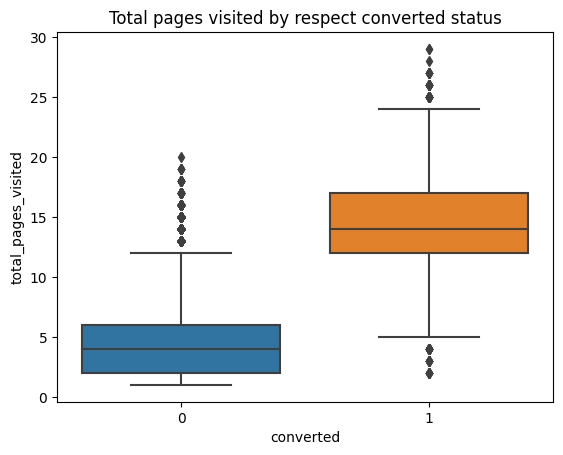

In [33]:
sns.boxplot(data=data, x='converted', y='total_pages_visited').set(title='Total pages visited by respect converted status')

In [30]:
conv1 = data['total_pages_visited'][data['converted']==1]
conv0 = data['total_pages_visited'][data['converted']==0]

_, p_value = levene(conv1, conv0)

if p_value < 0.05:
    print("The difference in variances between the two samples is statistically significant")
else:
    print("The difference in variances between the two samples is not statistically significant")

The difference in variances between the two samples is statistically significant


In [31]:
_, p_value = mannwhitneyu(conv1, conv0)
if p_value < 0.05:
    print("The means of the two samples are significantly different")
else:
    print("The means of the two samples are not significantly different")

The means of the two samples are significantly different


#### Analysis of the data reveals that users who convert typically visit more pages than those who do not, indicating that higher engagement may be linked to a greater likelihood of conversion. 

#### Additionally, the average number of pages visited tends to be higher for returning users compared to new users, suggesting that users who have previously visited the website are more likely to explore its content. However, it's important to note that the variable is subject to outliers, which may impact the analysis if not properly addressed.

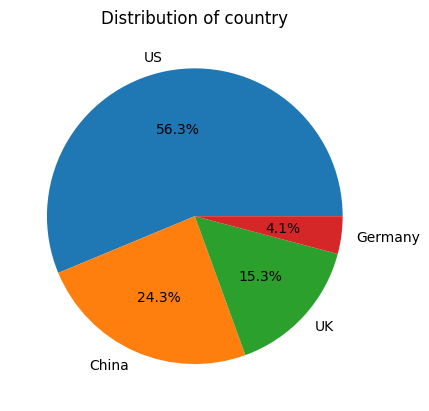

In [34]:
# Create a pie chart of the "day" variable
day_counts = data["country"].value_counts()
plt.pie(day_counts, labels=day_counts.index, autopct="%1.1f%%")
plt.title("Distribution of country")
plt.show()

In [35]:

contingency_table = pd.crosstab(data['converted'], data['country'])
contingency_table

country,China,Germany,UK,US
converted,,,,
0,69033,10963,41350,154054
1,89,730,2291,6070


In [36]:

chi2_stat, p_value, dof, expected_freq = chi2_contingency(contingency_table)


print("Statistique du chi-carré :", chi2_stat)
print("P-valeur :", p_value)
print("Degrés de liberté :", dof)
print("Fréquences attendues :\n", expected_freq)

if p_value < 0.05:
    print("There is a significant association between the variables")
else:
    print("There is no significant association between the variables")


Statistique du chi-carré : 3201.1431322688427
P-valeur : 0.0
Degrés de liberté : 3
Fréquences attendues :
 [[ 66892.25806452  11315.80645161  42233.22580645 154958.70967742]
 [  2229.74193548    377.19354839   1407.77419355   5165.29032258]]
There is a significant association between the variables


In [37]:
# Cramér-V coefficient computing
n = contingency_table.sum().sum()
min_dim = min(contingency_table.shape) - 1
cramer_v = np.sqrt(chi2_stat / (n * min_dim))

# Display Cramér-V coefficient 
print("Coefficient de Cramér-V :", cramer_v)

Coefficient de Cramér-V : 0.10605969138056096


FOR CONVERTION
Percentage of converted people that come from US :  3.8 %

Percentage of converted people that come from China :  0.1 %

Percentage of converted people that come from UK :  5.2 %

Percentage of converted people that come from Germany :  6.2 %

FOR NEW USER
Percentage of new users that come from US :  68.2 %

Percentage of new users that come from China :  69.89999999999999 %

Percentage of new users that come from UK :  67.9 %

Percentage of new users that come from Germany :  67.80000000000001 %


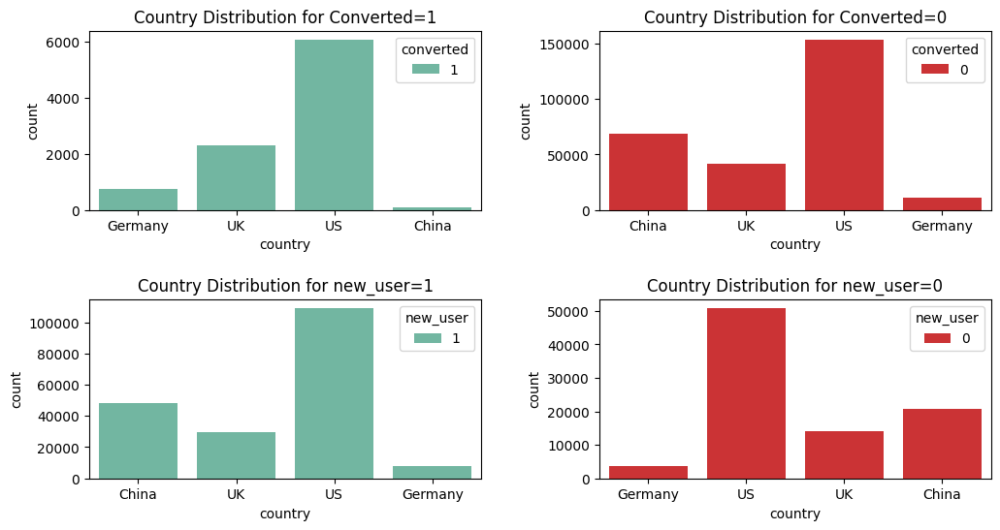

In [38]:
print('FOR CONVERTION')
print('Percentage of converted people that come from US : ', round((data[data['converted'] == 1]['country']=='US').sum()/data[data['country'] == 'US'].shape[0], 3)*100, '%')

print('\nPercentage of converted people that come from China : ', round((data[data['converted'] == 1]['country']=='China').sum()/data[data['country'] == 'China'].shape[0], 3)*100, '%')

print('\nPercentage of converted people that come from UK : ', round((data[data['converted'] == 1]['country']=='UK').sum()/data[data['country'] == 'UK'].shape[0], 3)*100, '%')

print('\nPercentage of converted people that come from Germany : ', round((data[data['converted'] == 1]['country']=='Germany').sum()/data[data['country'] == 'Germany'].shape[0], 3)*100, '%')

print('\nFOR NEW USER')
print('Percentage of new users that come from US : ', round((data[data['new_user'] == 1]['country']=='US').sum()/data[data['country'] == 'US'].shape[0], 3)*100, '%')

print('\nPercentage of new users that come from China : ', round((data[data['new_user'] == 1]['country']=='China').sum()/data[data['country'] == 'China'].shape[0], 3)*100, '%')

print('\nPercentage of new users that come from UK : ', round((data[data['new_user'] == 1]['country']=='UK').sum()/data[data['country'] == 'UK'].shape[0], 3)*100, '%')

print('\nPercentage of new users that come from Germany : ', round((data[data['new_user'] == 1]['country']=='Germany').sum()/data[data['country'] == 'Germany'].shape[0], 3)*100, '%')


# Create two subplots for the country  distribution by converted and new_user
fig, ((ax11, ax12), (ax21, ax22)) = plt.subplots(nrows=2, ncols=2, figsize=(12,6), gridspec_kw={'wspace': 0.3, 'hspace': 0.5})

# Plot the country distribution for converted equals 1
sns.countplot(x='country', hue='converted', data=data[data['converted'] == 1], ax=ax11, palette='Set2')
ax11.set_title('Country Distribution for Converted=1')

# Plot the country distribution for converted equals 0
sns.countplot(x='country', hue='converted', data=data[data['converted'] == 0], ax=ax12, palette='Set1')
ax12.set_title('Country Distribution for Converted=0')


# Plot the country distribution for new_user equals 1
sns.countplot(x='country', hue='new_user', data=data[data['new_user'] == 1], ax=ax21, palette='Set2')
ax21.set_title('Country Distribution for new_user=1')

# Plot the country distribution for new_user equals 0
sns.countplot(x='country', hue='new_user', data=data[data['new_user'] == 0], ax=ax22, palette='Set1')
ax22.set_title('Country Distribution for new_user=0')

plt.show()

[Text(0.5, 1.0, 'number of user by country with respect of converted status')]

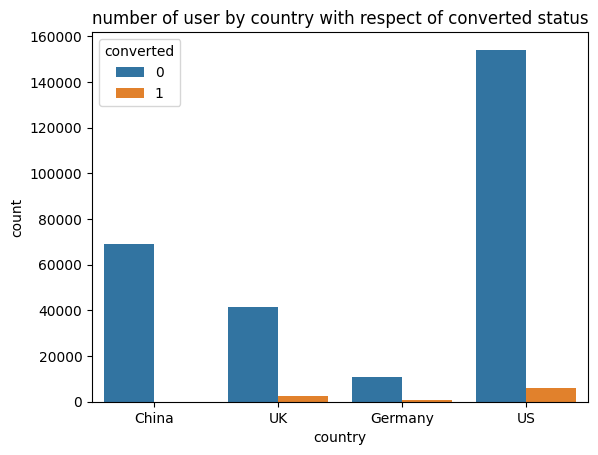

In [40]:
sns.countplot(data=data, x='country', hue='converted').set(title='number of user by country with respect of converted status')

#### From the plot, we can see that most of the users are from US, followed by China  and UK. 

#### The conversion rate seems to be relatively high for users from Germany and the United Kingdom, while the conversion rate for users from China is relatively low.

#### In all country, most of users are new users.

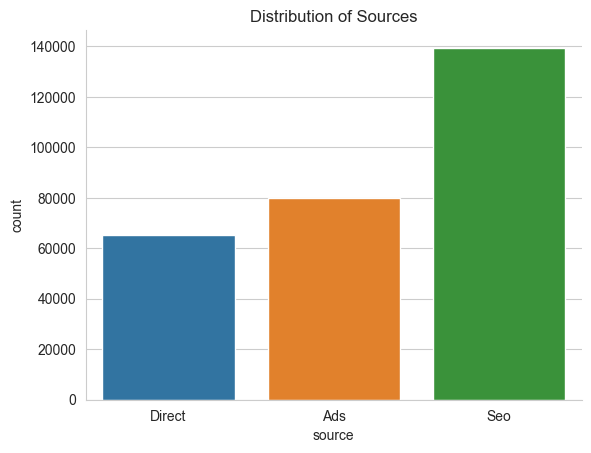

In [45]:
# Create a bar chart of the "day" variable
sns.countplot(data=data, x="source")
sns.set_style("whitegrid")
sns.despine()
plt.title("Distribution of Sources")
plt.show()

[Text(0.5, 1.0, 'Source distributions with respect of converted status')]

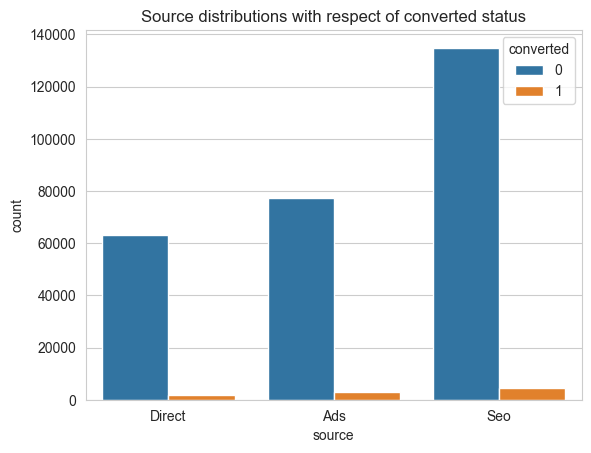

In [46]:
sns.countplot(data=data, x='source', hue='converted').set(title='Source distributions with respect of converted status')

In [47]:

contingency_table = pd.crosstab(data['converted'], data['source'])
contingency_table

source,Ads,Direct,Seo
converted,,,
0,77242,63266,134892
1,2785,1810,4585


In [48]:
chi2_stat, p_value, dof, expected_freq = chi2_contingency(contingency_table)


print("Statistique du chi-carré :", chi2_stat)
print("P-valeur :", p_value)
print("Degrés de liberté :", dof)
print("Fréquences attendues :\n", expected_freq)

if p_value < 0.05:
    print("There is a significant association between the variables")
else:
    print("There is no significant association between the variables")


Statistique du chi-carré : 59.43943750265396
P-valeur : 1.2384832650655317e-13
Degrés de liberté : 2
Fréquences attendues :
 [[ 77445.48387097  62976.77419355 134977.74193548]
 [  2581.51612903   2099.22580645   4499.25806452]]
There is a significant association between the variables


In [49]:
# Cramér-V coefficient computing
n = contingency_table.sum().sum()
min_dim = min(contingency_table.shape) - 1
cramer_v = np.sqrt(chi2_stat / (n * min_dim))

# Display Cramér-V coefficient 
print("Coefficient de Cramér-V :", cramer_v)

Coefficient de Cramér-V : 0.014452239763406203


FOR CONVERTION
Percentage of converted people that use Direct source :  2.8000000000000003 %

Percentage of converted people that use Ads source :  3.5000000000000004 %

Percentage of converted people that use Seo source :  3.3000000000000003 %

FOR NEW USER
Percentage of new users that use Direct source :  68.60000000000001 %

Percentage of new users that use Ads source :  68.60000000000001 %

Percentage of new users that that use Seo source :  68.5 %


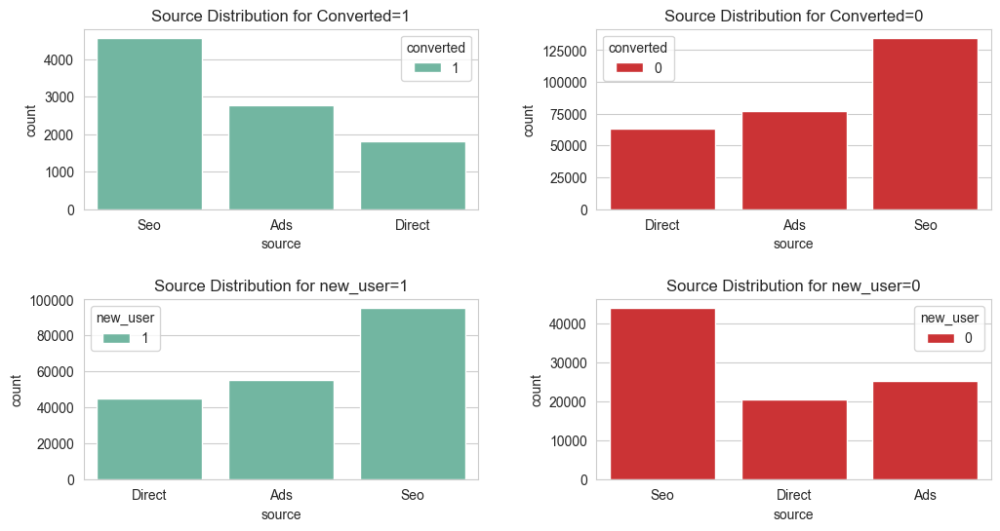

In [50]:
print('FOR CONVERTION')
print('Percentage of converted people that use Direct source : ', round((data[data['converted'] == 1]['source']=='Direct').sum()/data[data['source'] == 'Direct'].shape[0], 3)*100, '%')

print('\nPercentage of converted people that use Ads source : ', round((data[data['converted'] == 1]['source']=='Ads').sum()/data[data['source'] == 'Ads'].shape[0], 3)*100, '%')

print('\nPercentage of converted people that use Seo source : ', round((data[data['converted'] == 1]['source']=='Seo').sum()/data[data['source'] == 'Seo'].shape[0], 3)*100, '%')


print('\nFOR NEW USER')
print('Percentage of new users that use Direct source : ', round((data[data['new_user'] == 1]['source']=='Direct').sum()/data[data['source'] == 'Direct'].shape[0], 3)*100, '%')

print('\nPercentage of new users that use Ads source : ', round((data[data['new_user'] == 1]['source']=='Ads').sum()/data[data['source'] == 'Ads'].shape[0], 3)*100, '%')

print('\nPercentage of new users that that use Seo source : ', round((data[data['new_user'] == 1]['source']=='Seo').sum()/data[data['source'] == 'Seo'].shape[0], 3)*100, '%')



# Create two subplots for the country  distribution by converted and new_user
fig, ((ax11, ax12), (ax21, ax22)) = plt.subplots(nrows=2, ncols=2, figsize=(12,6), gridspec_kw={'wspace': 0.3, 'hspace': 0.5})

# Plot the country distribution for converted equals 1
sns.countplot(x='source', hue='converted', data=data[data['converted'] == 1], ax=ax11, palette='Set2')
ax11.set_title('Source Distribution for Converted=1')

# Plot the country distribution for converted equals 0
sns.countplot(x='source', hue='converted', data=data[data['converted'] == 0], ax=ax12, palette='Set1')
ax12.set_title('Source Distribution for Converted=0')


# Plot the country distribution for new_user equals 1
sns.countplot(x='source', hue='new_user', data=data[data['new_user'] == 1], ax=ax21, palette='Set2')
ax21.set_title('Source Distribution for new_user=1')

# Plot the country distribution for new_user equals 0
sns.countplot(x='source', hue='new_user', data=data[data['new_user'] == 0], ax=ax22, palette='Set1')
ax22.set_title('Source Distribution for new_user=0')

plt.show()

#### The bar chart provides an overview of the relative conversion rates for each traffic source. It indicates that the majority of the traffic comes from SEO and Ads, and the conversion rate for both sources is similar. Direct traffic has the lowest conversion rate.

#### For all sources of traffic to the website, most users is new users.

#### This visualization can help identify which traffic sources are performing well in terms of conversion rates and which ones need improvement.

### We can conclude that the target `converted` has a more or less strong relationship with all the explanatory variables. However the strongest relationship is with `total_pages_visted`

## Baseline model : simple logistic regression
Let's try a first basic model : simple logistic regression with only one feature (_total_pages_visited_).

In [51]:
# Separate target variable Y from features X
print("Separating labels from features...")

feature_base = 'total_pages_visited'

Y = data['converted']
X = data[[feature_base]]

print("...Done.")
print()

print('Y : ')
print(Y.head())
print()
print('X :')
print(X.head())

Separating labels from features...
...Done.

Y : 
0    0
1    0
2    1
3    0
4    0
Name: converted, dtype: int64

X :
   total_pages_visited
0                    2
1                    3
2                   14
3                    3
4                    3


In [52]:
print('Dividing into train and test sets...')
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2, random_state = 42, stratify=Y)
print('... Done!')

Dividing into train and test sets...
... Done!


In [53]:
print("Preprocessing X_train...")
print(X_train.head())
print()

preprocessor = StandardScaler()

X_train = preprocessor.fit_transform(X_train)
print("...Done!")
print(X_train[0:5,:]) # X_train is now a numpy array
print() 




Preprocessing X_train...
        total_pages_visited
162123                    4
27065                     3
70329                     3
138712                    8
104858                    3

...Done!
[[-0.2618471 ]
 [-0.56090876]
 [-0.56090876]
 [ 0.93439955]
 [-0.56090876]]



In [54]:
# Test pipeline
print("Preprocessing X_test...")
print(X_test.head())
print()
X_test = preprocessor.transform(X_test)
print("...Done!")
print(X_test[0:5,:]) # X_test is now a numpy array
print() 



Preprocessing X_test...
        total_pages_visited
249036                    4
135422                    5
242216                    5
209360                    5
1486                      3

...Done!
[[-0.2618471 ]
 [ 0.03721457]
 [ 0.03721457]
 [ 0.03721457]
 [-0.56090876]]



### Logistic Regression

In [55]:
model = LogisticRegression()
params = {
    'solver': ['saga', 'lbfgs'],
    'penalty': ['l2'],
    'C' : [1000, 100, 10, 1, 0.1]
}
#grid search
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=5, random_state=1)
gridsearch = GridSearchCV(estimator=model, param_grid=params, n_jobs=-1, cv=cv, scoring='f1')
gridsearch.fit(X_train, Y_train)

# Print the best parameters and best score and std
print("Best mean test score: %f , and best std test score: %f best using %s" % (gridsearch.best_score_, gridsearch.cv_results_['std_test_score'][gridsearch.best_index_], gridsearch.best_params_))

Best mean test score: 0.692488 , and best std test score: 0.009248 best using {'C': 1000, 'penalty': 'l2', 'solver': 'saga'}


In [56]:
# Train model
print("Train model...")
LR_classifier = LogisticRegression(C= 1000, penalty='l2',solver='saga')
LR_classifier.fit(X_train, Y_train)
print("...Done.")

Train model...
...Done.


In [57]:
# Predictions on training set
print("Predictions on training set...")
Y_train_pred = LR_classifier.predict(X_train)
print("...Done.")
print(Y_train_pred)
print()


# Predictions on test set
print("Predictions on test set...")
Y_test_pred = LR_classifier.predict(X_test)
print("...Done.")
print(Y_test_pred)
print()

Predictions on training set...
...Done.
[0 0 0 ... 0 0 0]

Predictions on test set...
...Done.
[0 0 0 ... 0 0 0]



#### This is a classification problem, where we are trying to predict whether a user will make a purchase or not based on various features.

#### To get an overall sense of how well our model is performing, it is a good idea to look at `accuracy`. However, `accuracy` alone can be misleading since we have imbalanced classes. In this cases, we might have a high `accuracy`, but our model may be failing to identify the minority class correctly.

#### In this problem, we want to optimize for a metric that balances between correctly identifying all the users who make a purchase (`recall`) and having high precision for those users (`precision`). This is because we want to target users who are most likely to make a purchase while minimizing the number of users who are wrongly targeted.

#### So in addition of `accuracy`, our aim is to have a high `F1 score` as possible, which means our model is correctly identifying a good proportion of users who make a purchase and minimizing the number of false positives.

In [58]:
# Print accuracy scores
print("accuracy_score on training set : ", accuracy_score(Y_train, Y_train_pred))
print("accuracy_score on test set : ", accuracy_score(Y_test, Y_test_pred))

accuracy_score on training set :  0.9828079977510717
accuracy_score on test set :  0.9835547122074636


In [59]:
print("recall_score on training set : ", recall_score(Y_train, Y_train_pred))
print("recall_score on test set : ", recall_score(Y_test, Y_test_pred))

recall_score on training set :  0.6002178649237473
recall_score on test set :  0.6105664488017429


In [60]:
print("precision_score on training set : ", precision_score(Y_train, Y_train_pred))
print("precision_score on test set : ", precision_score(Y_test, Y_test_pred))

precision_score on training set :  0.818418121054586
precision_score on test set :  0.8353204172876304


In [61]:
# Print scores
print("f1_score on training set : ", f1_score(Y_train, Y_train_pred))
print("f1_score on test set : ", f1_score(Y_test, Y_test_pred))

print("Deviation between f1_score on training set and test set : ", abs(f1_score(Y_train, Y_train_pred) - f1_score(Y_test, Y_test_pred)))

f1_score on training set :  0.6925373134328359
f1_score on test set :  0.7054751415984897
Deviation between f1_score on training set and test set :  0.012937828165653809


In [62]:
print("Confusion matrix on train set : ")
print(confusion_matrix(Y_train, Y_train_pred))
print(np.round(confusion_matrix(Y_train, Y_train_pred, normalize='true')*100, 2))

print()

print("Confusion matrix on test set : ")
print(confusion_matrix(Y_test, Y_test_pred))
print(np.round(confusion_matrix(Y_test, Y_test_pred, normalize='true')*100, 2))

print()

Confusion matrix on train set : 
[[219342    978]
 [  2936   4408]]
[[99.56  0.44]
 [39.98 60.02]]

Confusion matrix on test set : 
[[54859   221]
 [  715  1121]]
[[99.6   0.4 ]
 [38.94 61.06]]



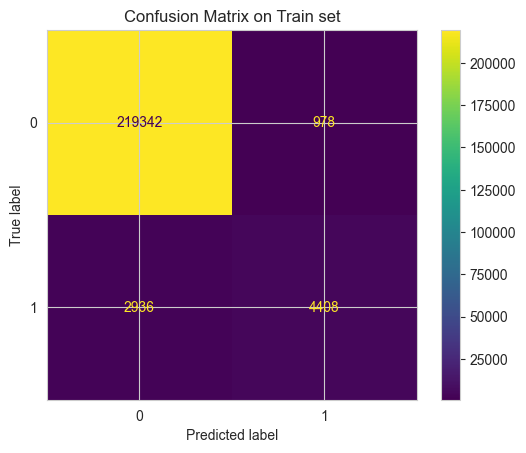

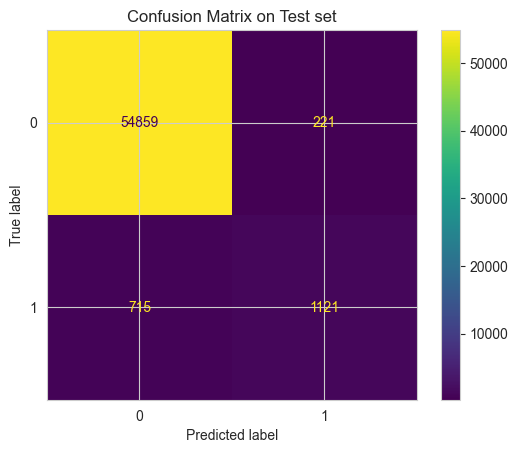

In [63]:
# Visualize confusion matrices
_ , ax = plt.subplots() # Get subplot from matplotlib
ax.set(title="Confusion Matrix on Train set") # Set a title that we will add into ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_estimator(LR_classifier, X_train, Y_train, ax=ax) # ConfusionMatrixDisplay from sklearn
plt.show()

_ , ax = plt.subplots() # Get subplot from matplotlib
ax.set(title="Confusion Matrix on Test set") # Set a title that we will add into ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_estimator(LR_classifier, X_test, Y_test, ax=ax) # ConfusionMatrixDisplay from sklearn
plt.show()

#### We could also use `AUC-ROC Curve`. This metric measures the performance of the model across all possible classification thresholds but is insensitive to the class imbalance. A higher `AUC-ROC score` indicates better overall performance of the model.

AUC-ROC score: 0.803


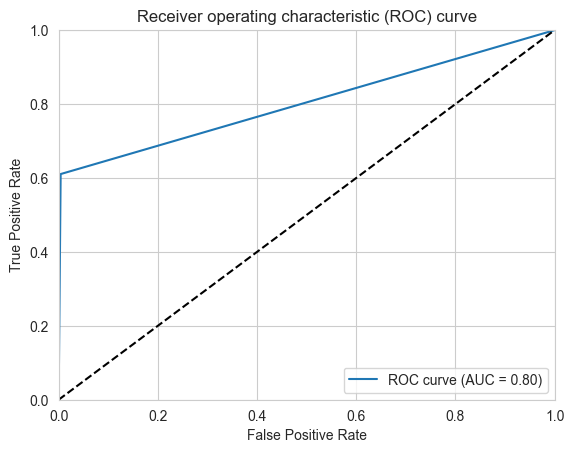

In [64]:
# y_pred_proba: predicted probabilities for positive class
# y_true: true labels (0 or 1)
fpr, tpr, thresholds = roc_curve(Y_test, Y_test_pred)
roc_auc = auc(fpr, tpr)

print("AUC-ROC score: {:.3f}".format(roc_auc))

# plot the ROC curve
plt.plot(fpr, tpr, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--') # diagonal line representing random guessing
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic (ROC) curve')
plt.legend(loc="lower right")
plt.show()

#### Because in this case we have imbalanced classes, we will rather use `AUC-PR curve`. This metric measures the trade-off between precision and recall and is more suitable for imbalanced datasets where the positive class is rare. A higher `AUC-PR score` indicates better overall performance of the model.

f1_score :  [0.0625     0.70547514 0.        ]
Best threshold: 1.000
AUC-PR score: 0.729


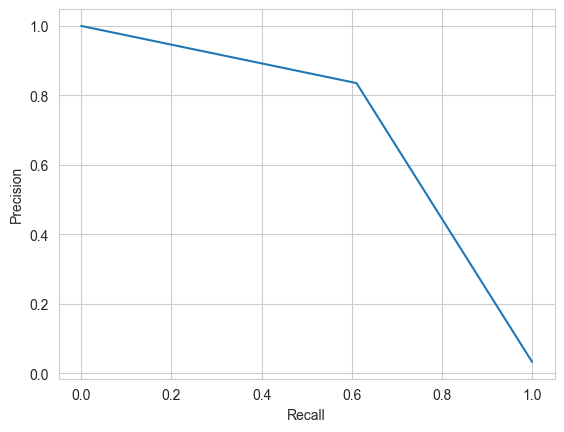

In [65]:
precision, recall, thresholds = precision_recall_curve(Y_test, Y_test_pred)
pr_auc = auc(recall, precision)


f1_scores = 2 * (precision * recall) / (precision + recall)
best_threshold = thresholds[np.argmax(f1_scores)]
print('f1_score : ', f1_scores )
print("Best threshold: {:.3f}".format(best_threshold))


print("AUC-PR score: {:.3f}".format(pr_auc))

plt.plot(recall, precision)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.show()

#### An `accuracy score` of `0.982` on the train set and an `accuracy score` of `0.983` on the test set indicates that the model is performing very well on both the training and testing data. This means that the model is able to correctly predict the conversion rate for the majority of the observations in both the training and testing datasets.

#### Similarly, an `F1 score` of `0.69` on the train set and an `F1 score` of `0.70` on the test set suggests that the model is able to balance `precision` and `recall` fairly well in predicting the conversion rate. However, the `F1 score` is slightly lower than the `accuracy score`, indicating that the model may have more difficulty predicting the conversion rate for certain observations.

#### Overall, the model seems to be performing well on both the training and testing data, although there may be some room for improvement in predicting the conversion rate for certain observations.

### Multivariate model : 
Let's train a multivariate model with all variables

In [66]:
# Separate target variable Y from features X
print("Separating labels from features...")

feature_base = 'total_pages_visited'

Y = data['converted']
X = data.drop('converted', axis=1)

print("...Done.")
print()

print('Y : ')
print(Y.head())
print()
print('X :')
print(X.head())

Separating labels from features...
...Done.

Y : 
0    0
1    0
2    1
3    0
4    0
Name: converted, dtype: int64

X :
   country  age  new_user  source  total_pages_visited
0    China   22         1  Direct                    2
1       UK   21         1     Ads                    3
2  Germany   20         0     Seo                   14
3       US   23         1     Seo                    3
4       US   28         1  Direct                    3


In [67]:
# Automatically detect names of numeric/categorical columns
numeric_features = []
categorical_features = []
for i,t in X.dtypes.items():
    if ('float' in str(t)) or ('int' in str(t)) :
        numeric_features.append(i)
    else :
        categorical_features.append(i)

print('Found numeric features ', numeric_features)
print('Found categorical features ', categorical_features)

Found numeric features  ['age', 'new_user', 'total_pages_visited']
Found categorical features  ['country', 'source']


In [68]:
print('Dividing into train and test sets...')
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2, random_state = 42, stratify=Y)
print('... Done!')

Dividing into train and test sets...
... Done!


In [69]:
# Create pipeline for numeric features
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')), # missing values will be replaced by columns' median
    ('scaler', StandardScaler())
])


# Create pipeline for categorical features
categorical_transformer = Pipeline(
    steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')), # missing values will be replaced by most frequent value
    ('encoder', OneHotEncoder(drop='first')) # first column will be dropped to avoid creating correlations between features
    ])


# Use ColumnTransformer to make a preprocessor object that describes all the treatments to be done
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

In [70]:
# Preprocessings on train set
print("Performing preprocessings on train set...")
print(X_train.head())
X_train = preprocessor.fit_transform(X_train)
print('...Done.')
print(X_train[0:5]) # MUST use this syntax because X_train is a numpy array and not a pandas DataFrame anymore
print()

# Preprocessings on test set
print("Performing preprocessings on test set...")
print(X_test.head()) 
X_test = preprocessor.transform(X_test) # Don't fit again !! The test set is used for validating decisions
# we made based on the training set, therefore we can only apply transformations that were parametered using the training set.
# Otherwise this creates what is called a leak from the test set which will introduce a bias in all your results.
print('...Done.')
print(X_test[0:5,:]) # MUST use this syntax because X_test is a numpy array and not a pandas DataFrame anymore
print()

Performing preprocessings on train set...
       country  age  new_user source  total_pages_visited
162123      US   20         1    Ads                    4
27065    China   29         1    Ads                    3
70329       US   36         0    Seo                    3
138712      US   23         1    Seo                    8
104858      UK   41         1    Ads                    3
...Done.
[[-1.27650481  0.6761303  -0.2618471   0.          0.          1.
   0.          0.        ]
 [-0.18867057  0.6761303  -0.56090876  0.          0.          0.
   0.          0.        ]
 [ 0.65742272 -1.47900486 -0.56090876  0.          0.          1.
   0.          1.        ]
 [-0.9138934   0.6761303   0.93439955  0.          0.          1.
   0.          1.        ]
 [ 1.26177508  0.6761303  -0.56090876  0.          1.          0.
   0.          0.        ]]

Performing preprocessings on test set...
       country  age  new_user  source  total_pages_visited
249036      US   32         1     

In [71]:
random_state = 42

classifiers = []


classifiers.append(DecisionTreeClassifier(random_state=random_state)) 
classifiers.append(AdaBoostClassifier(DecisionTreeClassifier(random_state=random_state )))
classifiers.append(AdaBoostClassifier(LogisticRegression(random_state = random_state,max_iter=1000)))
classifiers.append(RandomForestClassifier(random_state=random_state)) 
classifiers.append(GradientBoostingClassifier(random_state=random_state)) 
classifiers.append(KNeighborsClassifier()) 
classifiers.append(ExtraTreesClassifier())
classifiers.append(XGBClassifier())
classifiers.append(GaussianNB()) 
classifiers.append(LogisticRegression(random_state = random_state,max_iter=1000))



cv_results = []

for classifier in classifiers :
    print(f'Please wait, {classifier} model is processing ...')
    cv_results.append(cross_val_score(classifier, X_train, y = Y_train, cv=10, scoring ='f1'))
    print('========================================')
                                      


Please wait, DecisionTreeClassifier(random_state=42) model is processing ...
Please wait, AdaBoostClassifier(estimator=DecisionTreeClassifier(random_state=42)) model is processing ...
Please wait, AdaBoostClassifier(estimator=LogisticRegression(max_iter=1000, random_state=42)) model is processing ...
Please wait, RandomForestClassifier(random_state=42) model is processing ...
Please wait, GradientBoostingClassifier(random_state=42) model is processing ...
Please wait, KNeighborsClassifier() model is processing ...
Please wait, ExtraTreesClassifier() model is processing ...
Please wait, XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None,

In [72]:
cv_means = []
cv_std = []
for cv_result in cv_results:
    cv_means.append(cv_result.mean()) 
    cv_std.append(cv_result.std())

cv_res = pd.DataFrame({"CrossValMeans":cv_means, 
                       "CrossValerrors": cv_std, 
                       "Algorithms":  ["DecisionTreeClassifier",
                                      "AdaBoostClassifier - Decision Tree",
                                      "AdaBoostClassifier - Logistic Regression",
                                      "RandomForest",
                                      "GradientBoosting",
                                      "KNeighboors",
                                      "ExtraTreesClassifier",
                                      "XGBClassifier",
                                      "GaussianNB",
                                      "LogisticRegression"]})




cv_res.sort_values(by = 'CrossValMeans', ascending = False)

,CrossValMeans,CrossValerrors,Algorithms
9,0.761492,0.008860,LogisticRegression
4,0.758978,0.010750,GradientBoosting
7,0.756479,0.011602,XGBClassifier
2,0.750833,0.011112,AdaBoostClassifier - Logistic Regression
5,0.739014,0.011848,KNeighboors
3,0.731881,0.013892,RandomForest
6,0.723530,0.012106,ExtraTreesClassifier
1,0.719256,0.010789,AdaBoostClassifier - Decision Tree
0,0.715141,0.012134,DecisionTreeClassifier
8,0.688849,0.010761,GaussianNB


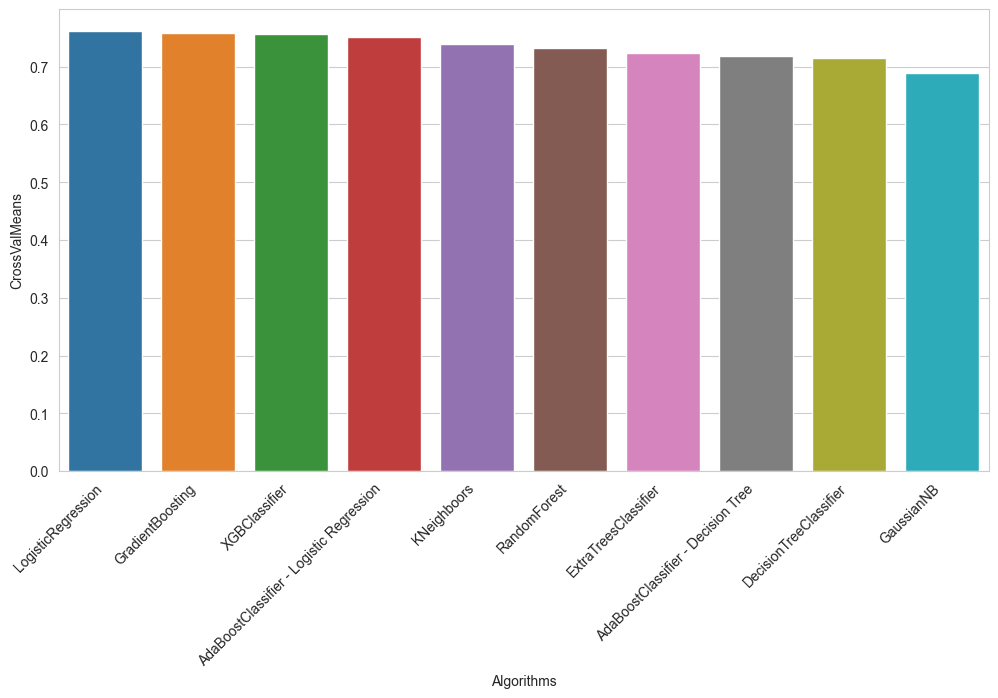

In [73]:
plt.figure(figsize=(12, 6))
chart = sns.barplot(data=cv_res.sort_values(by = 'CrossValMeans', ascending = False), x='Algorithms', y='CrossValMeans', orient='v')
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.show()

### Logistic Regression

In [74]:
# Create a Logistic Regression classifier object
model = LogisticRegression()

# Define the parameter grid
params = {
    'solver': ['saga', 'lbfgs'],
    'penalty': ['l2'],
    'C' : [1000, 500, 100, 90, 80, 10, 1, 0.1]

}
# Perform grid search using 5-fold cross-validation
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=5, random_state=1)
gridsearch = GridSearchCV(estimator=model, param_grid=params, n_jobs=-1, cv=cv, scoring='f1')

# Fit the grid search to the data
gridsearch.fit(X_train, Y_train)

# Print the best parameters and best score and std
print("Best mean test score: %f , and best std test score: %f best using %s" % (gridsearch.best_score_, gridsearch.cv_results_['std_test_score'][gridsearch.best_index_], gridsearch.best_params_))

Best mean test score: 0.762136 , and best std test score: 0.007955 best using {'C': 90, 'penalty': 'l2', 'solver': 'saga'}


In [75]:
# Train model
print("Train model...")
LR_classifier = LogisticRegression(C= 80, penalty='l2',solver='saga', max_iter=1000)
LR_classifier.fit(X_train, Y_train)
print("...Done.")

Train model...
...Done.


In [76]:
# Predictions on training set
print("Predictions on training set...")
Y_train_pred = LR_classifier.predict(X_train)
print("...Done.")
print(Y_train_pred)
print()


# Predictions on test set
print("Predictions on test set...")
Y_test_pred = LR_classifier.predict(X_test)
print("...Done.")
print(Y_test_pred)
print()

Predictions on training set...
...Done.
[0 0 0 ... 0 0 0]

Predictions on test set...
...Done.
[0 0 0 ... 0 0 0]



In [77]:
# Print scores
print("accuracy on training set : ", accuracy_score(Y_train, Y_train_pred))
print("accuracy on test set : ", accuracy_score(Y_test, Y_test_pred))
print()

print("f1-score on training set : ", f1_score(Y_train, Y_train_pred))
print("f1-score on test set : ", f1_score(Y_test, Y_test_pred))
print("std error between training and test :", abs(f1_score(Y_train, Y_train_pred)-f1_score(Y_test, Y_test_pred)))
print()

accuracy on training set :  0.9861374657389838
accuracy on test set :  0.9865591397849462

f1-score on training set :  0.7618832050701675
f1-score on test set :  0.7682520448348984
std error between training and test : 0.006368839764730905



recall : [1.         0.69063181 0.        ]
precision : [0.03225806 0.86552901 1.        ]
f1_score :  [0.0625     0.76825204 0.        ]
Best threshold: 1.000
AUC-PR score: 0.783


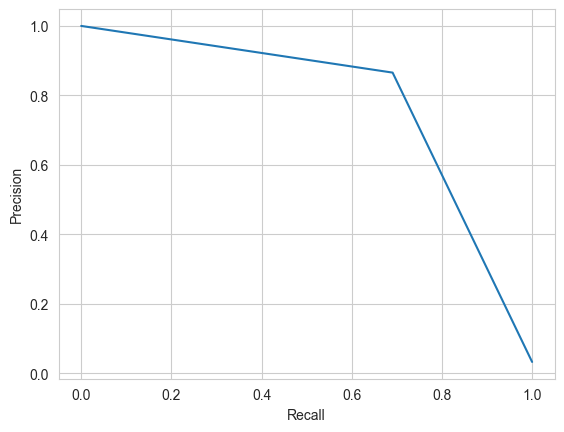

In [78]:
precision, recall, thresholds = precision_recall_curve(Y_test, Y_test_pred)
pr_auc = auc(recall, precision)


f1_scores = 2 * (precision * recall) / (precision + recall)
best_threshold = thresholds[np.argmax(f1_scores)]

print('recall :', recall)
print('precision :', precision)
print('f1_score : ', f1_scores )
print("Best threshold: {:.3f}".format(best_threshold))


print("AUC-PR score: {:.3f}".format(pr_auc))

plt.plot(recall, precision)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.show()

,age,new_user,total_pages_visited,country_Germany,country_UK,country_US,source_Direct,source_Seo
0,-0.599867,-0.785586,2.53011,3.770925,3.587454,3.242642,-0.209138,-0.037561


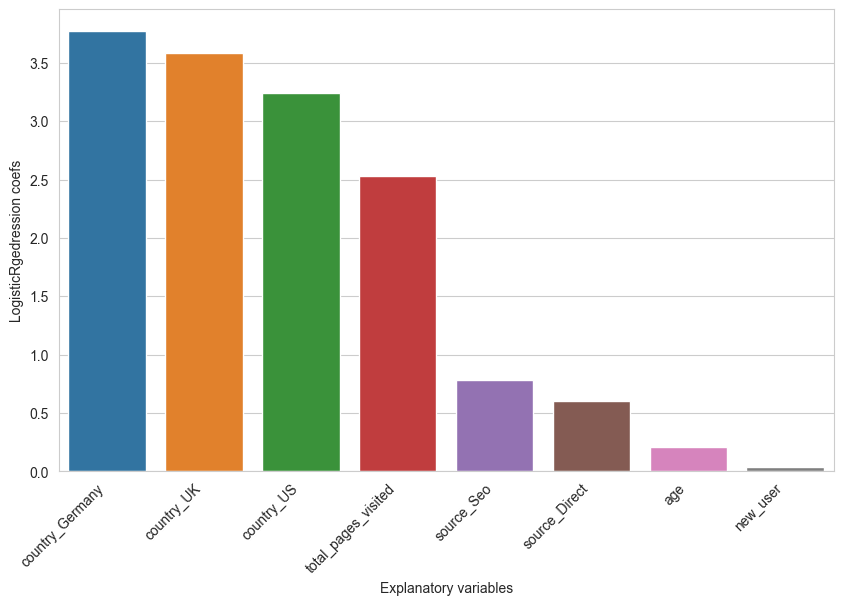

In [79]:
col_names = list(preprocessor.transformers_[0][1].get_feature_names_out()) + list(preprocessor.transformers_[1][1].get_feature_names_out())
coef = LR_classifier.coef_
imp_feat = pd.DataFrame(columns=col_names, data=coef)
display(imp_feat)


idx = np.argsort(imp_feat.values)[0][::-1]
plt.figure(figsize=(10, 6))
chart = sns.barplot(x=list(imp_feat.columns[idx]), y=np.sort(abs(imp_feat.values[0]))[::-1], orient='v')
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right')
chart.set_xlabel('Explanatory variables')
chart.set_ylabel('LogisticRgedression coefs')
plt.show()

#### We can observe that for logistic regression, the `country` variable has the most influence on the score.

## GradientBoosting

In [80]:
# Create a Logistic Regression classifier object
model = GradientBoostingClassifier()

# Define the parameter grid
params = {
    'learning_rate': [0.5, 0.1, 0.05],
    'n_estimators': [50, 60, 70],
    'max_depth': [3, 5, 7]
}
# Perform grid search using 5-fold cross-validation
gridsearch = GridSearchCV(estimator=model, param_grid=params, n_jobs=-1, cv=5, scoring='f1')

# Fit the grid search to the data
gridsearch.fit(X_train, Y_train)

# Print the best parameters and best score and std
print("Best mean test score: %f , and best std test score: %f best using %s" % (gridsearch.best_score_, gridsearch.cv_results_['std_test_score'][gridsearch.best_index_], gridsearch.best_params_))

Best mean test score: 0.759573 , and best std test score: 0.007058 best using {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 60}


In [81]:
# Train model
print("Train model...")
GB_classifier = GradientBoostingClassifier(learning_rate= 0.1, max_depth= 5, n_estimators= 60,  random_state=42)
GB_classifier.fit(X_train, Y_train)
print("...Done.")

Train model...
...Done.


In [82]:
# Predictions on training set
print("Predictions on training set...")
Y_train_pred = GB_classifier.predict(X_train)
print("...Done.")
print(Y_train_pred)
print()


# Predictions on test set
print("Predictions on test set...")
Y_test_pred = GB_classifier.predict(X_test)
print("...Done.")
print(Y_test_pred)
print()

Predictions on training set...
...Done.
[0 0 0 ... 0 0 0]

Predictions on test set...
...Done.
[0 0 0 ... 0 0 0]



In [83]:
# Print scores
print("accuracy on training set : ", accuracy_score(Y_train, Y_train_pred))
print("accuracy on test set : ", accuracy_score(Y_test, Y_test_pred))
print()

print("f1-score on training set : ", f1_score(Y_train, Y_train_pred))
print("f1-score on test set : ", f1_score(Y_test, Y_test_pred))
print("std error between training and test :", abs(f1_score(Y_train, Y_train_pred)-f1_score(Y_test, Y_test_pred)))
print()

accuracy on training set :  0.9863263405720711
accuracy on test set :  0.9864185817696254

f1-score on training set :  0.7668688684190819
f1-score on test set :  0.7675187969924813
std error between training and test : 0.0006499285733994054



recall : [1.         0.69498911 0.        ]
precision : [0.03225806 0.85695097 1.        ]
f1_score :  [0.0625    0.7675188 0.       ]
Best threshold: 1.000
AUC-PR score: 0.781


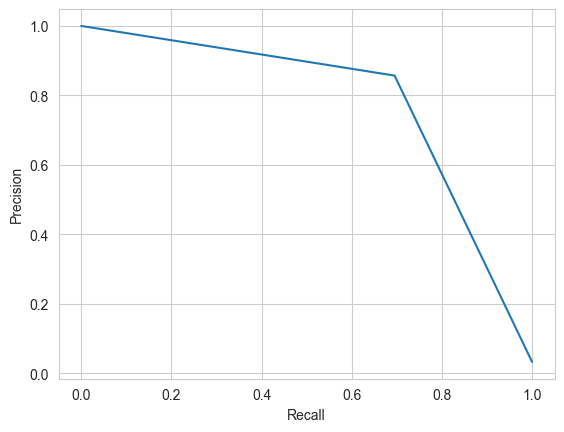

In [84]:
precision, recall, thresholds = precision_recall_curve(Y_test, Y_test_pred)
pr_auc = auc(recall, precision)


f1_scores = 2 * (precision * recall) / (precision + recall)
best_threshold = thresholds[np.argmax(f1_scores)]

print('recall :', recall)
print('precision :', precision)
print('f1_score : ', f1_scores )
print("Best threshold: {:.3f}".format(best_threshold))


print("AUC-PR score: {:.3f}".format(pr_auc))

plt.plot(recall, precision)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.show()

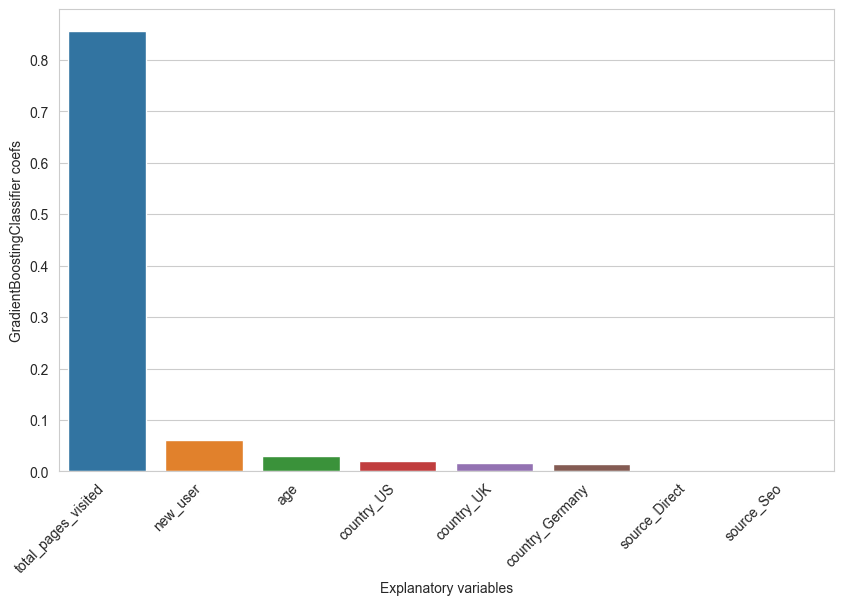

In [85]:
# get feature importances
importances = GB_classifier.feature_importances_

indices = np.argsort(importances)[::-1]

plt.figure(figsize=(10, 6))
chart = sns.barplot(x=np.array(col_names)[list(indices)], y=importances[list(indices)], orient='v')
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right')
chart.set_xlabel('Explanatory variables')
chart.set_ylabel('GradientBoostingClassifier coefs')
plt.show()

#### We can observe this time that for GradientBoosting, it is the `total_pages_visited` variable that has the most influence on the score. But The `AUC` is lower than Linear regression

## XG Boost

In [86]:
# Create a XGBClassifier object
model = XGBClassifier()

# Define the parameter grid
params = {
    'min_child_weight': [14, 15, 16],
    'n_estimators': [30, 40, 50],
    'gamma': [0.1, 0.5, 1],
    'max_depth': [2,4,8],
}
# Perform grid search using 5-fold cross-validation
gridsearch = GridSearchCV(estimator=model, param_grid=params, n_jobs=-1, cv=5, scoring='f1')

# Fit the grid search to the data
gridsearch.fit(X_train, Y_train)

# Print the best parameters and best score and std
print("Best mean test score: %f , and best std test score: %f best using %s" % (gridsearch.best_score_, gridsearch.cv_results_['std_test_score'][gridsearch.best_index_], gridsearch.best_params_))

Best mean test score: 0.762688 , and best std test score: 0.005739 best using {'gamma': 0.5, 'max_depth': 4, 'min_child_weight': 16, 'n_estimators': 40}


In [87]:
# Train model
print("Train model...")
XGB_classifier = XGBClassifier(gamma= 0.5, max_depth= 4, min_child_weight= 16, n_estimators= 40,  random_state=42)
XGB_classifier.fit(X_train, Y_train)
print("...Done.")

Train model...
...Done.


In [88]:
# Predictions on training set
print("Predictions on training set...")
Y_train_pred = XGB_classifier.predict(X_train)
print("...Done.")
print(Y_train_pred)
print()


# Predictions on test set
print("Predictions on test set...")
Y_test_pred = XGB_classifier.predict(X_test)
print("...Done.")
print(Y_test_pred)
print()

Predictions on training set...
...Done.
[0 0 0 ... 0 0 0]

Predictions on test set...
...Done.
[0 0 0 ... 0 0 0]



In [89]:
# Print scores
print("accuracy on training set : ", accuracy_score(Y_train, Y_train_pred))
print("accuracy on test set : ", accuracy_score(Y_test, Y_test_pred))
print()

print("f1-score on training set : ", f1_score(Y_train, Y_train_pred))
print("f1-score on test set : ", f1_score(Y_test, Y_test_pred))
print("std error between training and test :", abs(f1_score(Y_train, Y_train_pred)-f1_score(Y_test, Y_test_pred)))
print()

accuracy on training set :  0.9862428842504743
accuracy on test set :  0.9862253144985593

f1-score on training set :  0.7652877697841726
f1-score on test set :  0.764423076923077
std error between training and test : 0.000864692861095584



recall : [1.         0.69281046 0.        ]
precision : [0.03225806 0.85254692 1.        ]
f1_score :  [0.0625     0.76442308 0.        ]
Best threshold: 1.000
AUC-PR score: 0.778


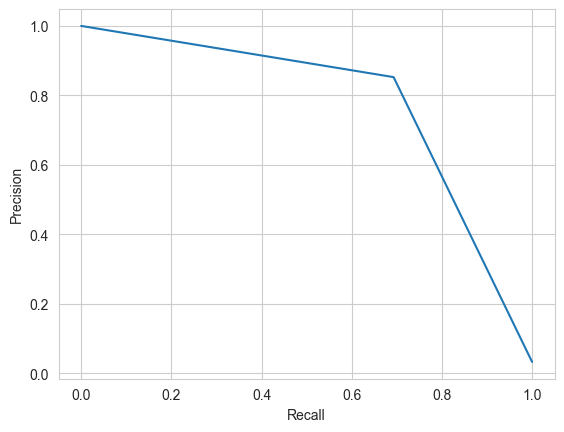

In [90]:
precision, recall, thresholds = precision_recall_curve(Y_test, Y_test_pred)
pr_auc = auc(recall, precision)


f1_scores = 2 * (precision * recall) / (precision + recall)
best_threshold = thresholds[np.argmax(f1_scores)]

print('recall :', recall)
print('precision :', precision)
print('f1_score : ', f1_scores )
print("Best threshold: {:.3f}".format(best_threshold))


print("AUC-PR score: {:.3f}".format(pr_auc))

plt.plot(recall, precision)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.show()

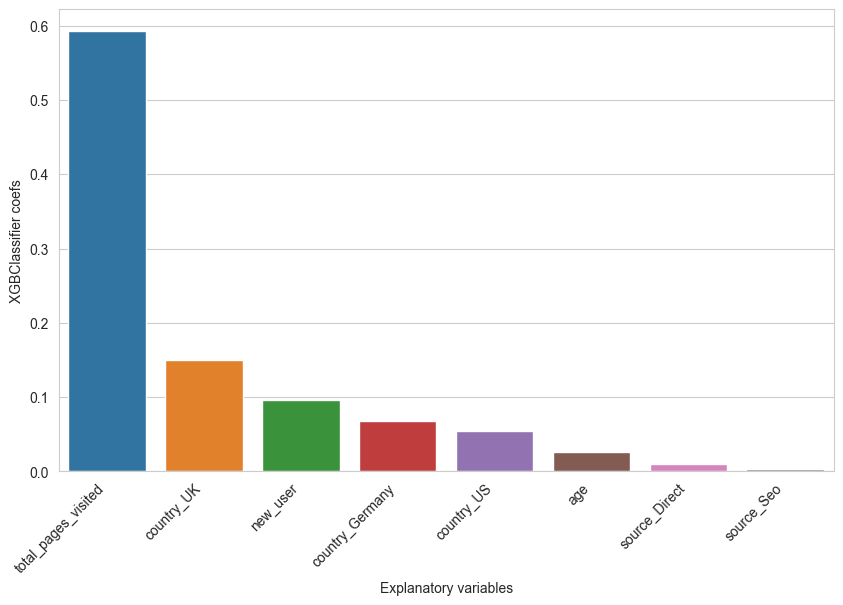

In [91]:
# get feature importances
importances = XGB_classifier.feature_importances_

indices = np.argsort(importances)[::-1]

plt.figure(figsize=(10, 6))
chart = sns.barplot(x=np.array(col_names)[list(indices)], y=importances[list(indices)], orient='v')
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right')
chart.set_xlabel('Explanatory variables')
chart.set_ylabel('XGBClassifier coefs')
plt.show()

#### We can observe this time that for XGBoost, it is also the `total_pages_visited` variable that has the most influence on the score. But The `AUC` is also lower than Linear regression and GradientBossting

## Adaboost - Logistic Regression

In [92]:
# Create a AdaBoostClassifier(LR_classifier) object
model = AdaBoostClassifier(LR_classifier)

# Define the parameter grid
params = {
    
    'n_estimators': [50, 60, 70],
    
}
# Perform grid search using 5-fold cross-validation
gridsearch = GridSearchCV(estimator=model, param_grid=params, n_jobs=-1, cv=5, scoring='f1')

# Fit the grid search to the data
gridsearch.fit(X_train, Y_train)

# Print the best parameters and best score and std
print("Best mean test score: %f , and best std test score: %f , best using %s" % (gridsearch.best_score_, gridsearch.cv_results_['std_test_score'][gridsearch.best_index_], gridsearch.best_params_))

/Users/christiansegnou/miniconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/christiansegnou/miniconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/christiansegnou/miniconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/christiansegnou/miniconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/christiansegnou/miniconda3/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/chr

Best mean test score: 0.762085 , and best std test score: 0.006432 , best using {'n_estimators': 70}


In [93]:
# Train model
print("Train model...")
AB_LR_classifier = AdaBoostClassifier(estimator=LR_classifier, n_estimators=70, random_state=42)
AB_LR_classifier.fit(X_train, Y_train)
print("...Done.")

Train model...
...Done.


In [94]:
# Predictions on training set
print("Predictions on training set...")
Y_train_pred = AB_LR_classifier.predict(X_train)
print("...Done.")
print(Y_train_pred)
print()


# Predictions on test set
print("Predictions on test set...")
Y_test_pred = AB_LR_classifier.predict(X_test)
print("...Done.")
print(Y_test_pred)
print()

Predictions on training set...
...Done.
[0 0 0 ... 0 0 0]

Predictions on test set...
...Done.
[0 0 0 ... 0 0 0]



In [95]:
# Print scores
print("accuracy on training set : ", accuracy_score(Y_train, Y_train_pred))
print("accuracy on test set : ", accuracy_score(Y_test, Y_test_pred))
print()

print("f1-score on training set : ", f1_score(Y_train, Y_train_pred))
print("f1-score on test set : ", f1_score(Y_test, Y_test_pred))
print("std error between training and test :", abs(f1_score(Y_train, Y_train_pred)-f1_score(Y_test, Y_test_pred)))
print()

accuracy on training set :  0.9861242884250474
accuracy on test set :  0.9864185817696254

f1-score on training set :  0.7627487795719112
f1-score on test set :  0.7661119515885023
std error between training and test : 0.0033631720165910872



recall : [1.         0.68954248 0.        ]
precision : [0.03225806 0.86181076 1.        ]
f1_score :  [0.0625     0.76611195 0.        ]
Best threshold: 1.000
AUC-PR score: 0.781


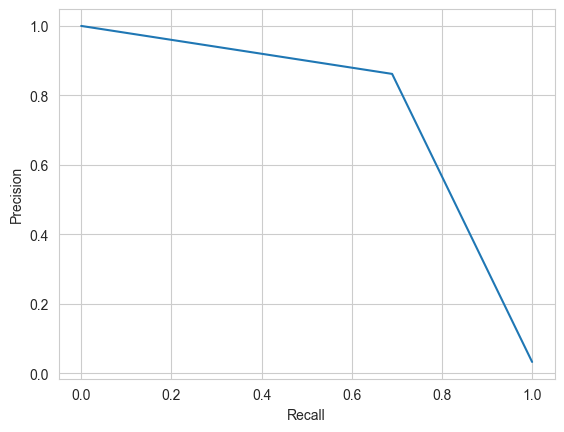

In [96]:
precision, recall, thresholds = precision_recall_curve(Y_test, Y_test_pred)
pr_auc = auc(recall, precision)


f1_scores = 2 * (precision * recall) / (precision + recall)
best_threshold = thresholds[np.argmax(f1_scores)]

print('recall :', recall)
print('precision :', precision)
print('f1_score : ', f1_scores )
print("Best threshold: {:.3f}".format(best_threshold))


print("AUC-PR score: {:.3f}".format(pr_auc))

plt.plot(recall, precision)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.show()

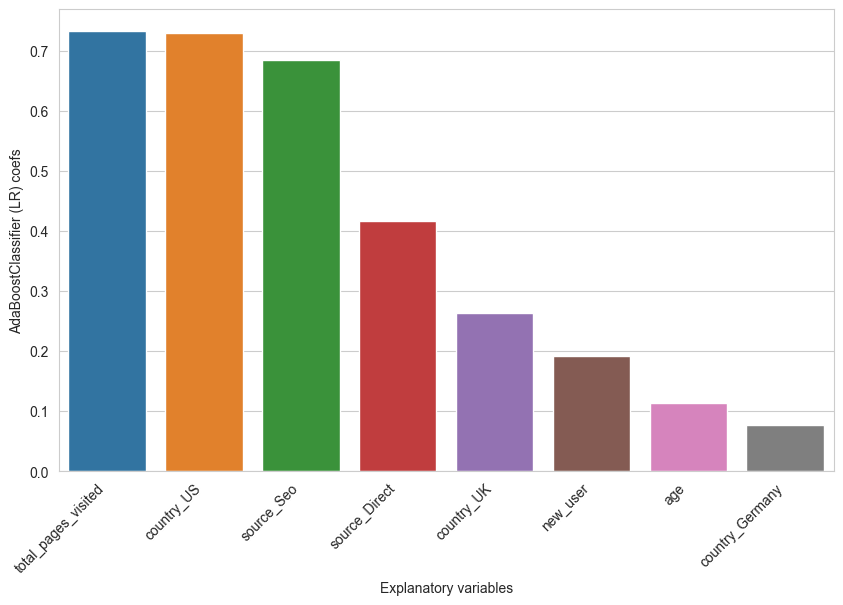

In [97]:
# get feature importances
importances = abs(AB_LR_classifier.estimators_[0].coef_[0])

indices = np.argsort(importances)[::-1]

plt.figure(figsize=(10, 6))
chart = sns.barplot(x=np.array(col_names)[list(indices)], y=importances[list(indices)], orient='v')
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right')
chart.set_xlabel('Explanatory variables')
chart.set_ylabel('AdaBoostClassifier (LR) coefs')
plt.show()

#### We can observe this time that for AdaBoostClassifier, it is also the `total_pages_visited` variable that has the most influence on the score. But The `AUC` is also lower than Linear regression and equal to GradientBossting's AUC

## Voting

In [98]:
v_clf = VotingClassifier(estimators=[
         ('LR', LR_classifier), ('GB',GB_classifier), ('XGB', XGB_classifier), ('ADB-LR', AB_LR_classifier)], voting='soft', weights=[4, 3, 2, 1])

v_clf = v_clf.fit(X_train, Y_train)


In [99]:

Y_train_pred = v_clf.predict(X_train)
Y_test_pred = v_clf.predict(X_test)

print("f1-score on train set : ", f1_score(Y_train, Y_train_pred))
print("f1-score on test set : ", f1_score(Y_test, Y_test_pred))

f1-score on train set :  0.7646749342352498
f1-score on test set :  0.7647236484445786


recall : [1.         0.68954248 0.        ]
precision : [0.03225806 0.85830508 1.        ]
f1_score :  [0.0625     0.76472365 0.        ]
Best threshold: 1.000
AUC-PR score: 0.779


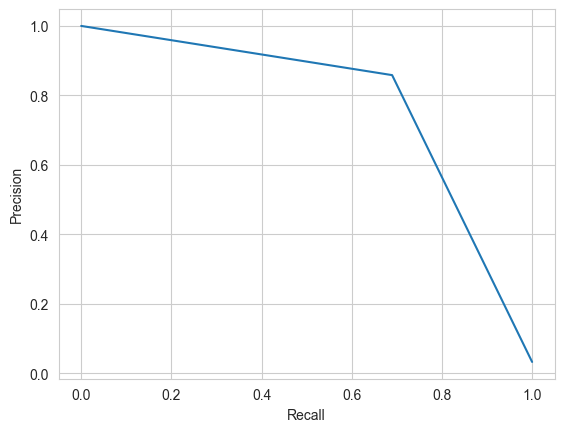

In [100]:
precision, recall, thresholds = precision_recall_curve(Y_test, Y_test_pred)
pr_auc = auc(recall, precision)


f1_scores = 2 * (precision * recall) / (precision + recall)
best_threshold = thresholds[np.argmax(f1_scores)]

print('recall :', recall)
print('precision :', precision)
print('f1_score : ', f1_scores )
print("Best threshold: {:.3f}".format(best_threshold))


print("AUC-PR score: {:.3f}".format(pr_auc))

plt.plot(recall, precision)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.show()

### No model performs better than `Logistic Regression` !!!